 <center> <h1> <b> Pattern Recognition and Machine Learning (EE5610 - EE2802 - AI2000 - AI5000) </b> </h1> </center>

<b> Programming Assignment - 05 : Dynamic Time Warping (DTW)  </b>


We expect you to code the dynamic time warping algorithm from scratch in this programming assignment. The skeleton code is provided for you to understand the algorithm. At the end of the assignment, you need to write an algorithm to perform an isolated digit recognition task using Dynamic Time Warping (DTW) codes. Isolated digit recognition is the task of recognizing the digit from the test speech signal having a single digit in isolation.

<b> Instructions </b>
1. Plagiarism is strictly prohibited.
2. Delayed submissions will be penalized with a scaling factor of 0.5 per day.
3. Please DO NOT use any machine learning libraries unless and otherwise specified.








<h4> <b> Part (a). Dynamic Time Warping(DTW): </b>  In this part you need to try and implement the basic sequence matching algorithm DTW. </h4>
<dt> <h4> Two sequences A and B can be compared using a euclidean distance
<center> $ A = (x_1, x_2, x_3, ..., x_M)$ </center> <br>
<center> $ B = (y_1, y_2, y_3, ..., y_N)$ </center> <br> </h4> </dt>
<dt> <h4> Now the distance is computed as </h4> </dt>
<center> $ D(A,B) = \frac{1}{N} \sum_1^N || x_n - y_n||$</center> </h4> </dt>
<dt> <h4> There are two main issues </h4> </dt>
<dd> <h4> 1. What if the sequences are not aligned in time ?</h4> </dt>
<dd> <h4> 2. What if the sequences have varying lengths ?</h4> </dt>
<dt> <h4> The non-linear alignment path produces a better similarity measure. </h4> </dt>

![picture](https://drive.google.com/uc?export=view&id=1XWTK0XUpDIuf-5nbe7pk6uPx29-22zF0)

<dt> <h4> <b> Algorithm </b> </h4> </dt>
<dt> <h4>  1. Compute distance matrix $D_{M\times N}$ between A and B </h4> </dt>
<dt> <h4>  2. Compute accumulated distance matrix $C_{M\times N}$ between A and B </h4> </dt>
<dd> <h4>  ~ Initialize: C(0,0) = D(0,0) </h4> </dd>
<dd> <h4>  ~ for i=1,2,..M and j=1,2,...N  <dd> <h4>  ~ Update C <dd> <h4> C(i,j) = D(i,j) + min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> <dd> <h4>  ~ Store the best Path <dd> <h4> P(i,j) = arg min {C(i−1, j−1), C(i, j−1), C(i−1, j)} </h4> </dd> </h4> </dd> </h4> </dd>
<dt> <h4>  3. C(M,N) gives the similarity measure </h4> </dt>
<dt> <h4>  4. Backtrack the best alignment path <br> <center> $ q_T^* = (M,N) \\ q_{t-1}^* = P(q_t^*) \qquad t = T,T-1,....1$ </center></h4> </dt>
<dt> <h4> <b> Programming question </b> </h4> </dt>
<dt> <h4>  1. Consider the following two sequences $A = [4,3,7,0,2,6,5]$, and $B = [3,7,1,6,1,5,4,4]$. Write a DTW algorithm to find the optimal similarity/distance between them. </h4> </dt>
<dd> <h4> - Compute the distance matrix between the two sequences </dd> </h4>
<dd> <h4> - Compute the accumulative distance matrix </dd> </h4>
<dd> <h4> - Backtrack from the accumulative distance matrix to get the optimal path and thereby compute the optimal distance </dd> </h4>
<dd> <h4> - Plot the optimal path on both the distance matrix and cumulative distance matrix to verify the DTW codes </dd> </h4>



Distance Matrix: 
[[ 1.  9.  9.  4.  9.  1.  0.  0.]
 [ 0. 16.  4.  9.  4.  4.  1.  1.]
 [16.  0. 36.  1. 36.  4.  9.  9.]
 [ 9. 49.  1. 36.  1. 25. 16. 16.]
 [ 1. 25.  1. 16.  1.  9.  4.  4.]
 [ 9.  1. 25.  0. 25.  1.  4.  4.]
 [ 4.  4. 16.  1. 16.  0.  1.  1.]]
Accumulated Distance Matrix:
[[ 1. 10. 19. 23. 32. 33. 33. 33.]
 [ 1. 17. 14. 23. 27. 31. 32. 33.]
 [17.  1. 37. 15. 51. 31. 40. 41.]
 [26. 50.  2. 38. 16. 41. 47. 56.]
 [27. 51.  3. 18. 17. 25. 29. 33.]
 [36. 28. 28.  3. 28. 18. 22. 26.]
 [40. 32. 44.  4. 19. 18. 19. 20.]]
Optimal path: 
[(7, 8), (7, 7), (6, 6), (5, 5), (4, 5), (3, 4), (2, 3), (1, 2), (1, 1)]
Optimal distance: 
20.0


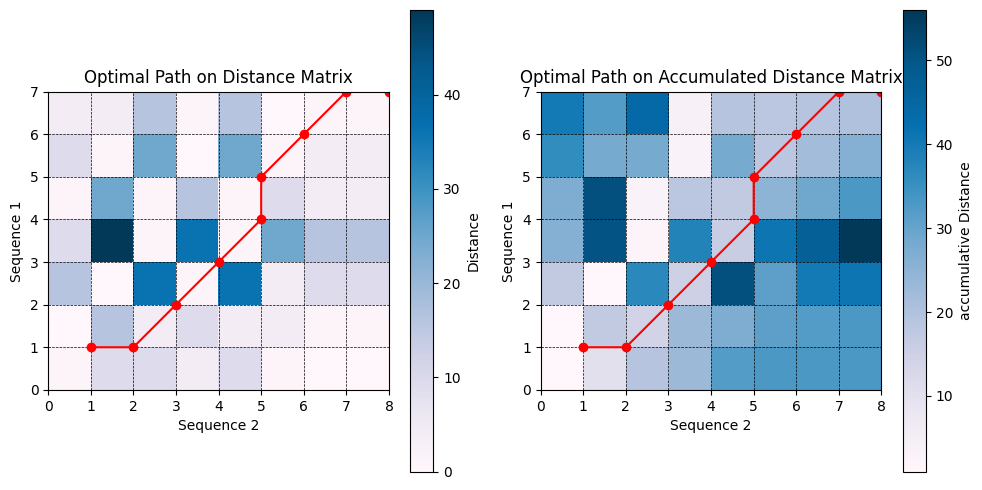

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

###########################################################
#Function to obtain the optimal distance and path between two sequences
###########################################################
def DTW(sequence1,sequence2):
    #######################################################
    # Input  : Two sequences
    # Output : DTW path and optimal distance
    #######################################################
    distance_matrix=np.zeros((len(sequence1), len(sequence2)))
    for i in range(len(sequence1)):
      for j in range(len(sequence2)):
        distance_matrix[i][j] = (sequence1[i] - sequence2[j])**2

    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################
    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.zeros((len(sequence1), len(sequence2)))
    DTW_cumulate_Matrix[0][0] = distance_matrix[0][0]
    for i in range(1,len(sequence2)):
       DTW_cumulate_Matrix[0][i] = distance_matrix[0][i]+DTW_cumulate_Matrix[0][i-1]
    for i in range(1,len(sequence1)):
       DTW_cumulate_Matrix[i][0] = distance_matrix[i][0]+DTW_cumulate_Matrix[i-1][0]
    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1, len(sequence1)):
        for j in range(1, len(sequence2)):
            current_distance = distance_matrix[i][j]
            DTW_cumulate_Matrix[i][j] = current_distance + min(
                DTW_cumulate_Matrix[i-1][j],
                DTW_cumulate_Matrix[i-1][j - 1],
                DTW_cumulate_Matrix[i][j - 1]
            )

    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    #######################################################
    opt_distance = 0.0
    i = len(sequence1) # length of the sequence1
    j = len(sequence2) # length of the sequence2
    path=[]
    path.append((i,j))
    i=i-1
    j=j-1
    opt_distance=opt_distance+(sequence1[i] - sequence2[j])**2
    while i!=0 and j!=0: #Start from the last point and backtrack
        #Get the indexes (i,j) of the small value among (DTW_cumulate_Matrix[i-1,j], DTW_cumulate_Matrix[i-1,j-1], DTW_cumulate_Matrix[i,j-1])
        indexes=[(i-1,j),(i-1,j-1),(i,j-1)]
        index = np.argmin([DTW_cumulate_Matrix[idx] for idx in indexes])
        i , j = indexes[index]

        # Add the current indexes distance
        opt_distance = opt_distance + (sequence1[i] - sequence2[j])**2   #Compute the distance between the points sequence1[i] and sequence2[j]



        #Store the required indexes to obtain the optimal path
        path.append((i+1,j+1))
    path.append((1,1))
    opt_distance = opt_distance + (sequence1[0] - sequence2[0])**2

    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################
    return path,opt_distance,distance_matrix,DTW_cumulate_Matrix


def plotDTWpath(sequence1,sequence2):
    #######################################################
    # Inputs : sequence1 and sequence2
    # Outputs : plot of optimal path on distance matrix and cumulative distance matrix
    #######################################################
    a,b,c,d = DTW(sequence1,sequence2)
    #Compute distance and cumulative distance between the given templates
    distance_matrix = c
    cumulative_distance_matrix = d
    #Obtain the optimal path using "DTW" function
    optimal_path = a
    #Plot the optimal path on distance and cumulative matrices and verify the DTW codes
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(distance_matrix, cmap='PuBu', origin='lower', extent=[0, len(sequence2), 0, len(sequence1)])
    plt.plot([p[1] for p in optimal_path], [p[0] for p in optimal_path], marker='o', color='r')
    plt.title('Optimal Path on Distance Matrix')
    plt.xlabel('Sequence 2')
    plt.ylabel('Sequence 1')
    plt.colorbar(label='Distance')
    plt.grid(color='k', linestyle='--', linewidth=0.5)

    # Plot the cumulative distance matrix
    plt.subplot(1, 2, 2)
    plt.imshow(cumulative_distance_matrix, cmap='PuBu', origin='lower', extent=[0, len(sequence2), 0, len(sequence1)])
    plt.plot([p[1] for p in optimal_path], [p[0] for p in optimal_path], marker='o', color='r')
    plt.title('Optimal Path on Accumulated Distance Matrix')
    plt.xlabel('Sequence 2')
    plt.ylabel('Sequence 1')
    plt.colorbar(label='accumulative Distance')
    plt.grid(color='k', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

A = [4, 3, 7, 0, 2, 6, 5]
B = [3, 7, 1, 6, 1, 5, 4, 4]
a,b,c,d=DTW(A, B)
print('Distance Matrix: ')
print(c)
print('Accumulated Distance Matrix:')
print(d)
print('Optimal path: ')
print(a)
print('Optimal distance: ')
print(b)
plotDTWpath(A, B)

<b> Report your observations </b>

1.Initial and final points should be in the path.

2.We can only move up,right,diagnol when constructing accumulated distance matrix

3.accumulated distance matrix gives optimal path and optimal distance




<dt> <h4> <b> Part (b): </b> In this part of the assignment, we expect you to build the Isolated digit recognition system with the help of the above written DTW algorithm. </dt> </h4>

![picture](https://drive.google.com/uc?export=view&id=1nGtWwbDg8PJBNwck_dUt2mmsCBshrGYc)



<dt> <h4> 1. Record one repetition each of the digits zero, one, two, three, four, five, six, seven, eight, and nine. The modules to record the voice in online mode are provided here. If you are not comfortable using the online recording modules, you can record the digits offline and access them in google colab through proper codes. </dt> </h4>
<dt> <h4> 2. Record three further repetitions of the same digits (Isolated words) as test data. </dt> </h4>  
<dt> <h4> 3. The codes to compute the signal's templates (Mel Frequency Cepstral Coefficients) are provided. Please use them to obtain the templates of the speech signals. </dt> </h4>  
<dt> <h4> 4. Write an algorithm to perform isolated digit recognition with the help of the DTW codes. </dt> </h4>
<dt> <h4> 5. Take two pairs such that one pair is the repetition of the same digit and another one is two different digits. Plot the optimal DTW path on distance and cumulative distance matrices for both cases.   </dt> </h4>
<dt> <h4> 6. Evaluate the digit recognition accuracy, i.e., the percentage of correctly recognized trials out of each digit's total number of attempts. </dt> </h4>
<dt> <h4> 7. Create a confusion matrix and report the most confusing digits. </dt> </h4>


**Module to record the voice in online mode**

In [ ]:
from IPython.display import Javascript
from google.colab import output
from base64 import b64decode
from io import BytesIO
!pip -q install pydub
from pydub import AudioSegment

RECORD = """
const sleep  = time => new Promise(resolve => setTimeout(resolve, time))
const b2text = blob => new Promise(resolve => {
  const reader = new FileReader()
  reader.onloadend = e => resolve(e.srcElement.result)
  reader.readAsDataURL(blob)
})
var record = time => new Promise(async resolve => {
  stream = await navigator.mediaDevices.getUserMedia({ audio: true })
  recorder = new MediaRecorder(stream)
  chunks = []
  recorder.ondataavailable = e => chunks.push(e.data)
  recorder.start()
  await sleep(time)
  recorder.onstop = async ()=>{
    blob = new Blob(chunks)
    text = await b2text(blob)
    resolve(text)
  }
  recorder.stop()
})
"""

def record(sec=3):
  display(Javascript(RECORD))
  s = output.eval_js('record(%d)' % (sec*1000))
  b = b64decode(s.split(',')[1])
  audio = AudioSegment.from_file(BytesIO(b))
  return audio

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
import scipy.io.wavfile
import io
import os
from IPython.display import Audio

#### Please comment below line, if you already uploaded the 'recording.wav' in '/content/'
!rm recording.wav

#### You can run this module in the loop to record more repetitions of the digits.

if os.path.isfile('recording.wav'):
        print("wavefile exists, later part of the code uses 'recording.wav' as input speech")
else:
  for i in range(10):
        print("Recording the digits")
        wav = record(3.0) #It will record three seconds of your speech. You can change the duration.
        wav = wav.set_frame_rate(16000)
        sig=wav.get_array_of_samples()
        samples=np.array(sig).T.astype(np.float32)
        fp_arr = np.array(samples).T.astype(np.float32)
        fp_arr /= np.iinfo(sig.typecode).max
        scipy.io.wavfile.write(f'recording{i}.wav', 16000, fp_arr) #Please change the name.

  for i in range(10):
    for j in range(3):
        print("Recording the digits")
        wav = record(3.0) #It will record three seconds of your speech. You can change the duration.
        wav = wav.set_frame_rate(16000)
        sig=wav.get_array_of_samples()
        samples=np.array(sig).T.astype(np.float32)
        fp_arr = np.array(samples).T.astype(np.float32)
        fp_arr /= np.iinfo(sig.typecode).max
        scipy.io.wavfile.write(f'recording{j}_digit{i}.wav', 16000, fp_arr) #Please change the name.

# wn = Audio('recording.wav', autoplay=True)
# display(wn)

In [ ]:
import scipy.io.wavfile as wav
import numpy as np
from python_speech_features import mfcc as psf_mfcc
import speechpy

def compute_mfcc(wavfile):
    (rate, sig) = wav.read(wavfile)
    sig = sig - np.mean(sig)
    mfcc_feat = psf_mfcc(sig, rate, numcep=13, winlen=0.025, winstep=0.01, nfilt=40, lowfreq=20, highfreq=4000, winfunc=np.hamming)
    mfcc_feat_cmvn = speechpy.processing.cmvnw(mfcc_feat, win_size=301, variance_normalization=False)
    return mfcc_feat_cmvn

template1 = []
template2 = []
for i in range(10):
    template1.append(compute_mfcc("/content/recording{}.wav".format(i)))
for i in range(10):
  row=[]
  for j in range(3):
    row.append(compute_mfcc("/content/recording{}_digit{}.wav".format(j,i)))
  template2.append(row)



**Algorithm to perform isolated digit recognition**

Optimal distance: 
21761.39365386963
Optimal path of digit0 repeatation 1 : 


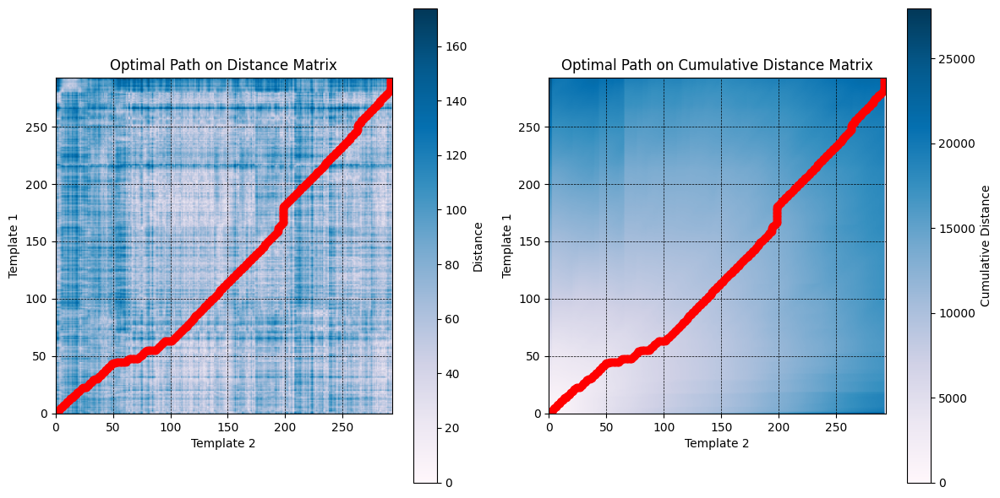

Optimal distance: 
19762.90357208252
Optimal path of digit0 repeatation 2 : 


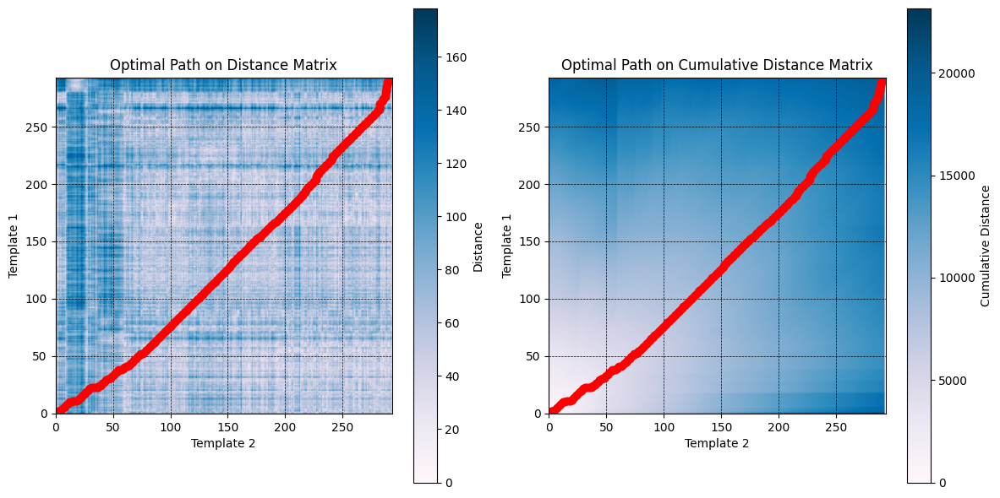

Optimal distance: 
22913.610692977905
Optimal path of digit0 repeatation 3 : 


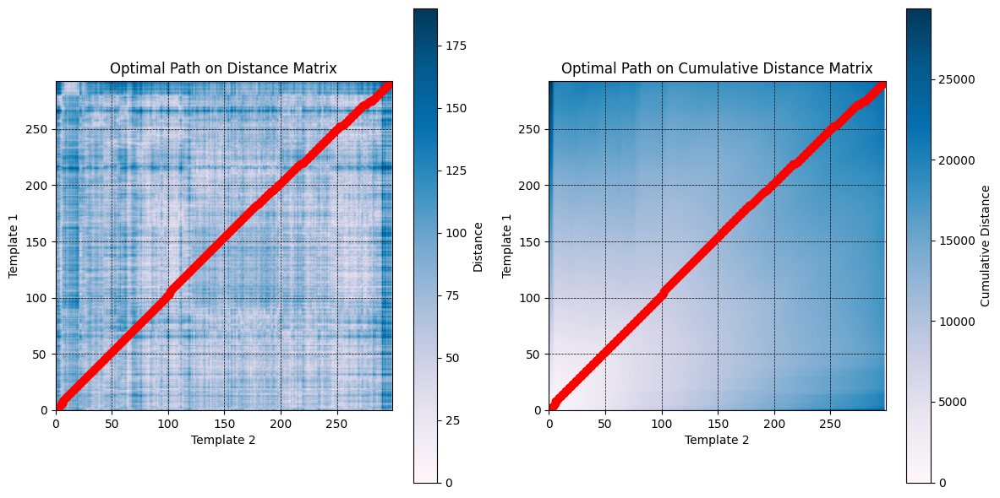

Optimal distance: 
17336.404126167297
Optimal path of digit1 repeatation 1 : 


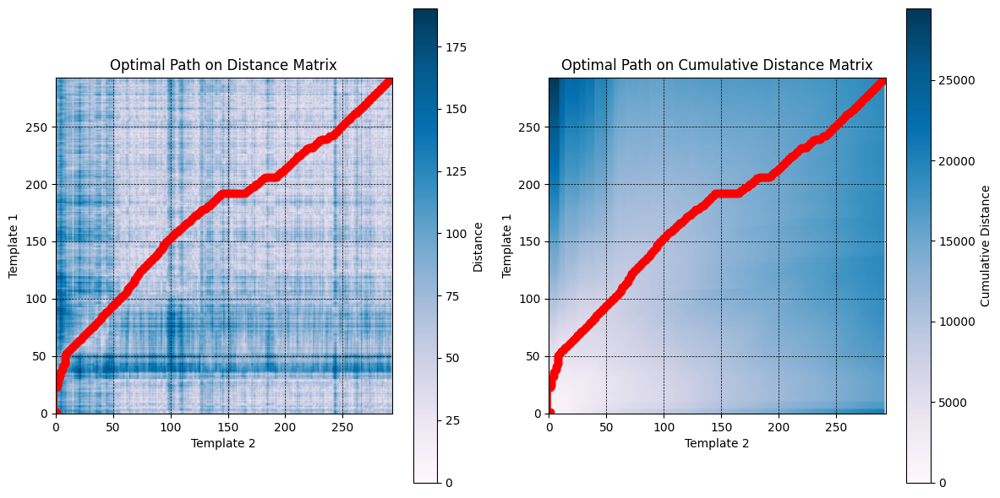

Optimal distance: 
17116.097116470337
Optimal path of digit1 repeatation 2 : 


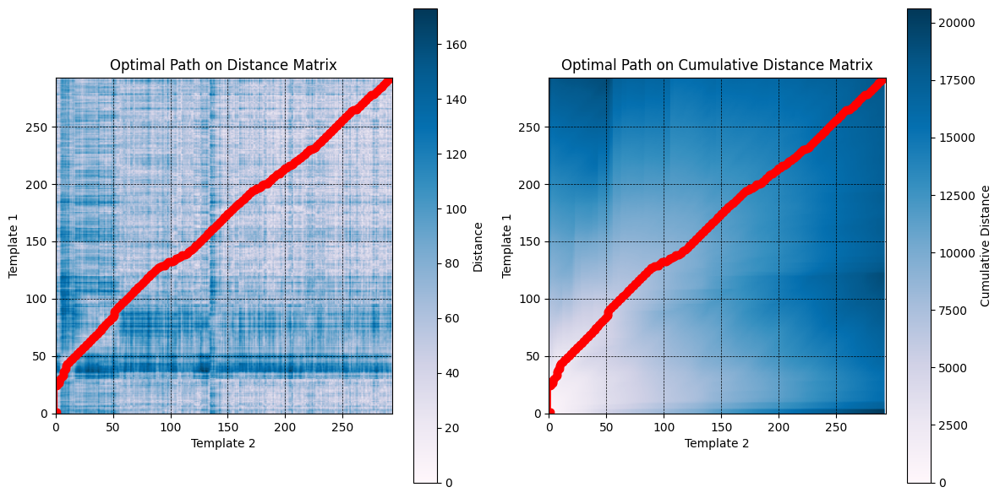

Optimal distance: 
19725.84960746765
Optimal path of digit1 repeatation 3 : 


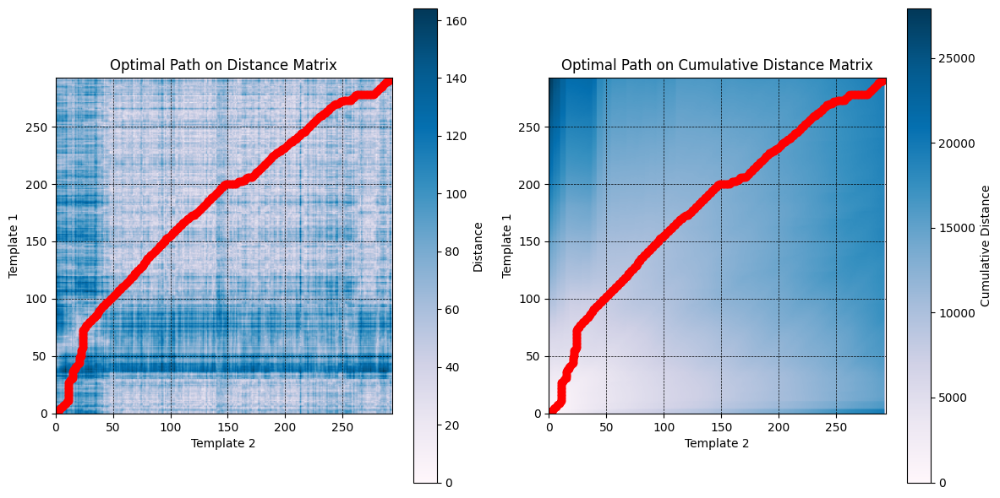

Optimal distance: 
21720.504217147827
Optimal path of digit2 repeatation 1 : 


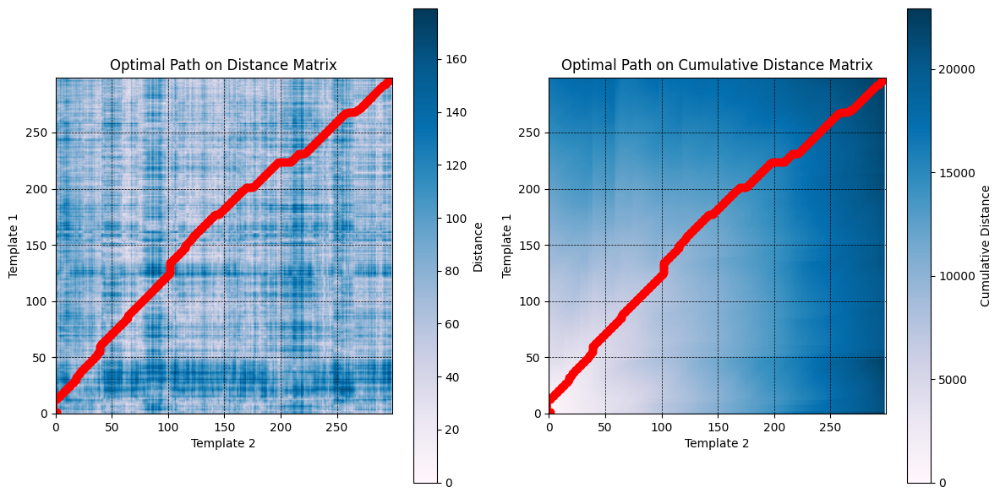

Optimal distance: 
21519.99564933777
Optimal path of digit2 repeatation 2 : 


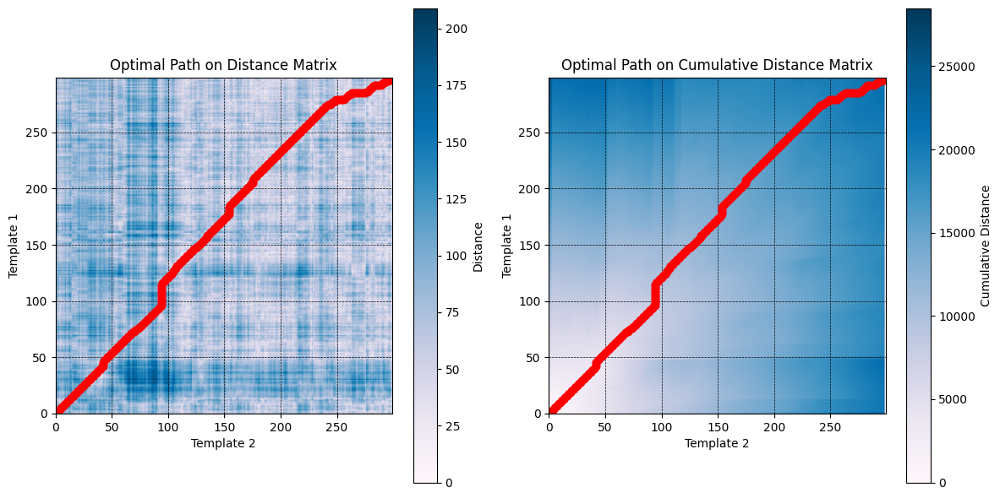

Optimal distance: 
19569.002208709717
Optimal path of digit2 repeatation 3 : 


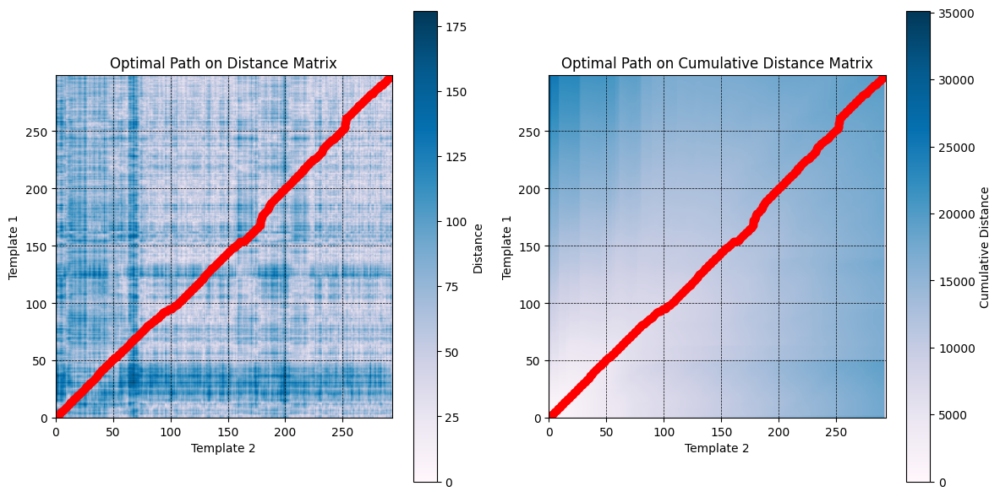

Optimal distance: 
20395.57971572876
Optimal path of digit3 repeatation 1 : 


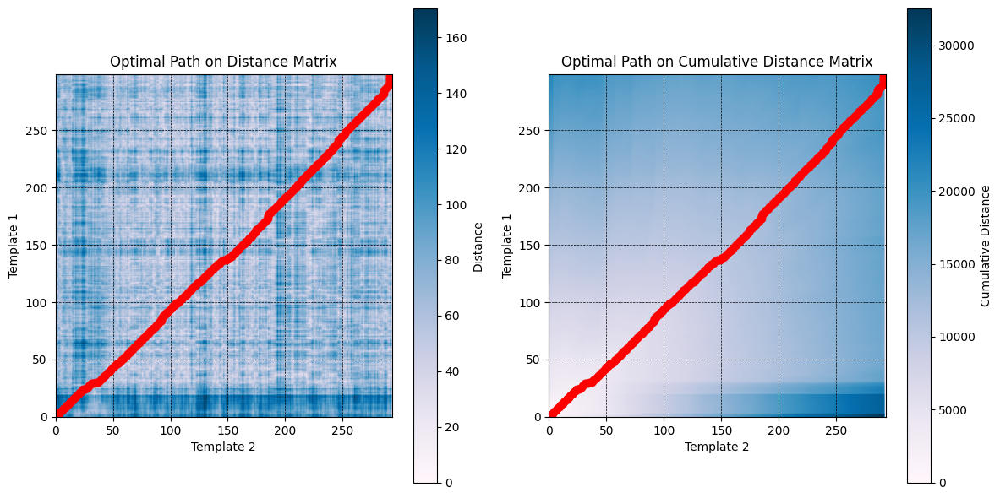

Optimal distance: 
19611.107572555542
Optimal path of digit3 repeatation 2 : 


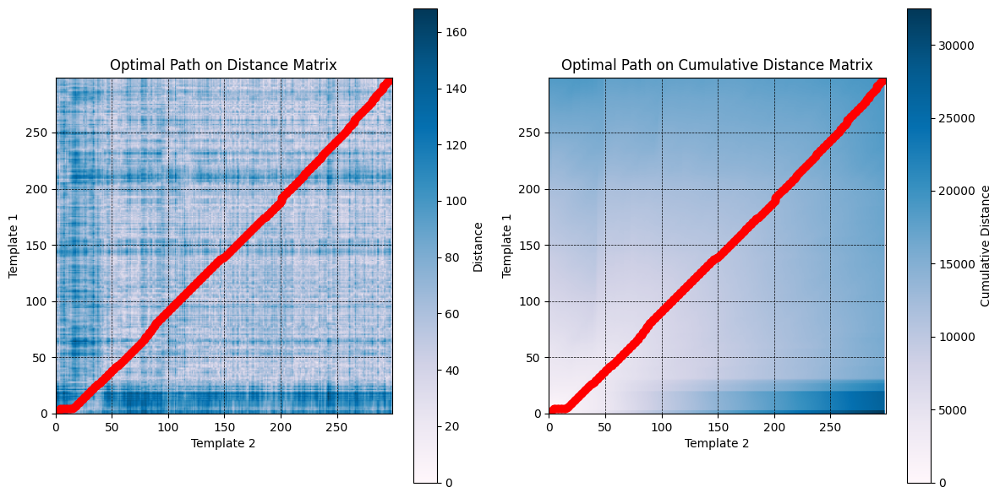

Optimal distance: 
22962.64624595642
Optimal path of digit3 repeatation 3 : 


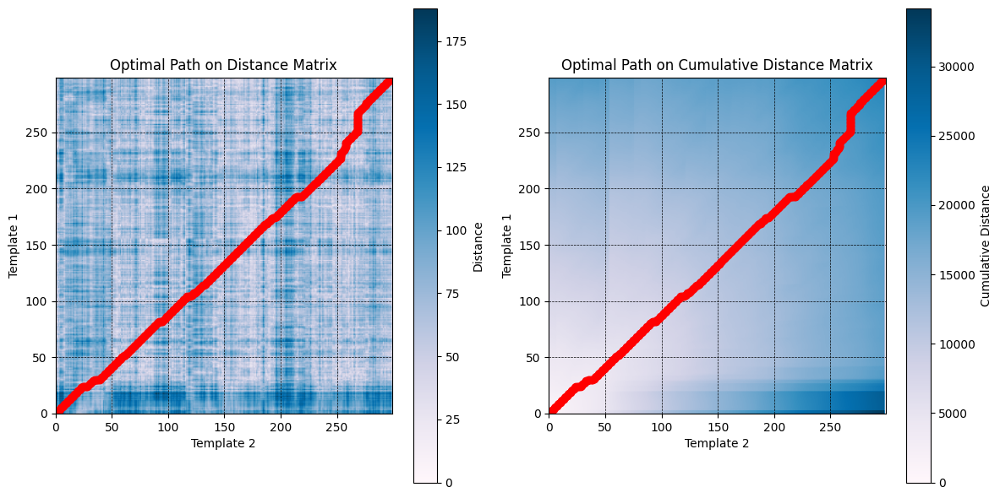

Optimal distance: 
22206.53821182251
Optimal path of digit4 repeatation 1 : 


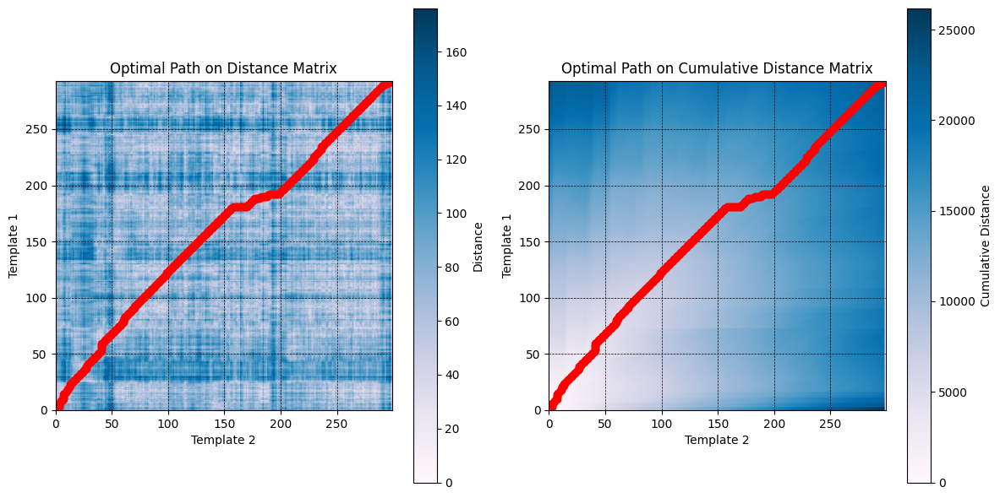

Optimal distance: 
22158.190879821777
Optimal path of digit4 repeatation 2 : 


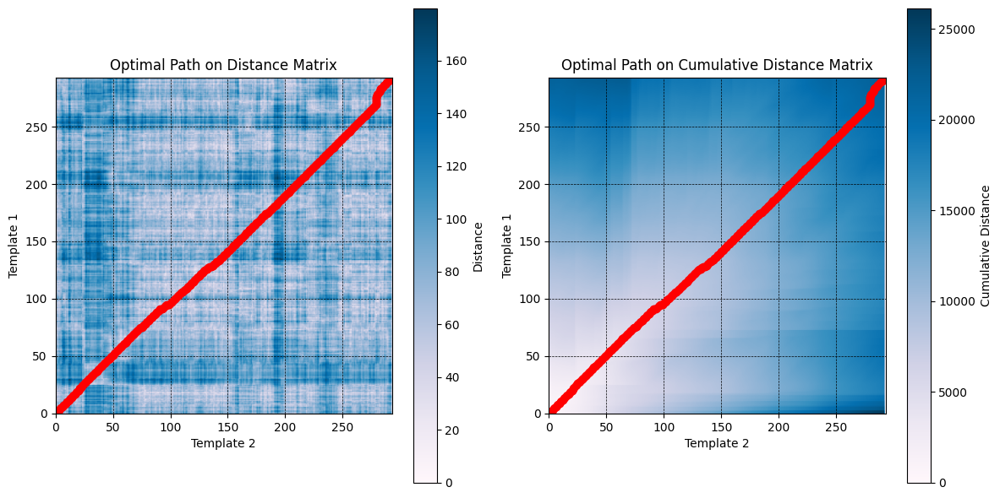

Optimal distance: 
23793.423915863037
Optimal path of digit4 repeatation 3 : 


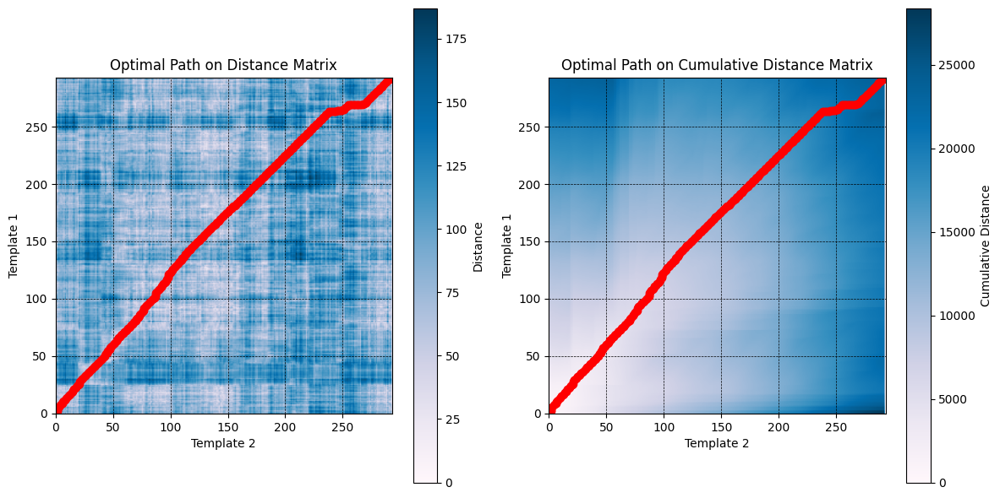

Optimal distance: 
21892.49301147461
Optimal path of digit5 repeatation 1 : 


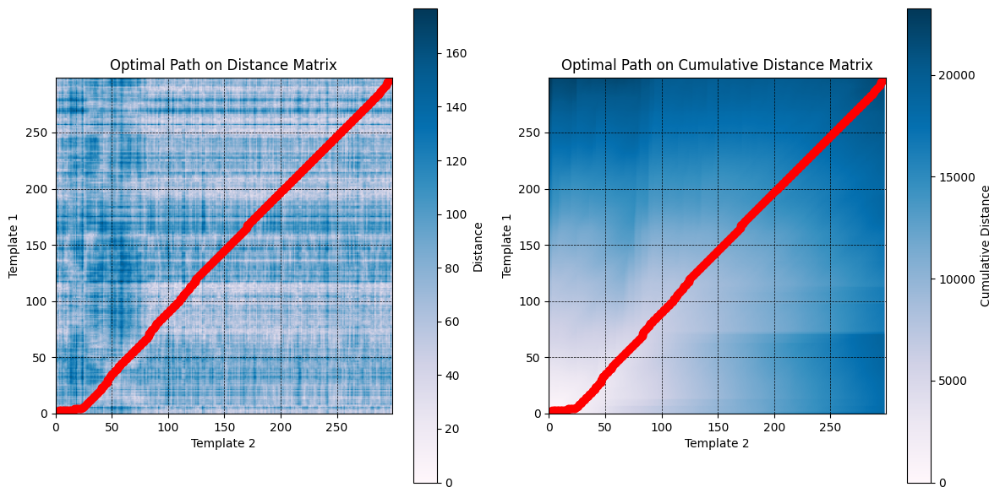

Optimal distance: 
22425.608757019043
Optimal path of digit5 repeatation 2 : 


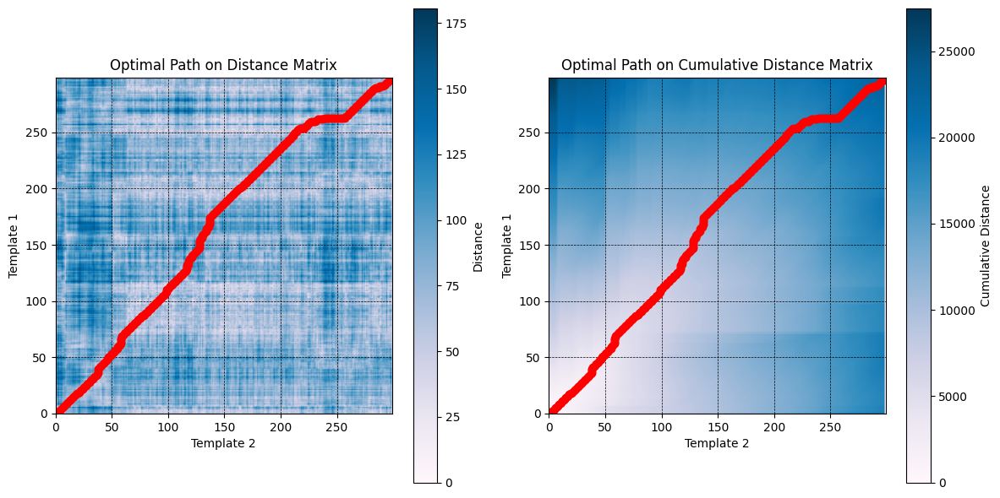

Optimal distance: 
23634.838035583496
Optimal path of digit5 repeatation 3 : 


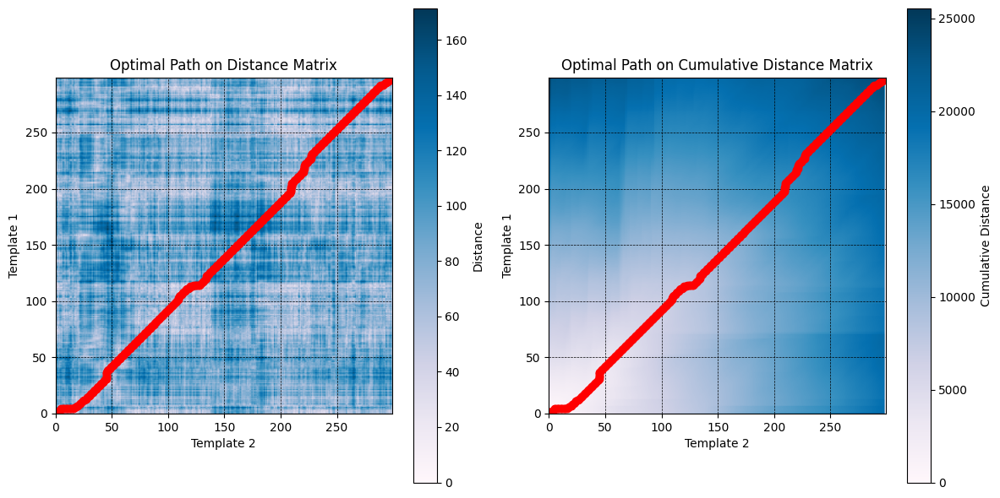

Optimal distance: 
21870.892908096313
Optimal path of digit6 repeatation 1 : 


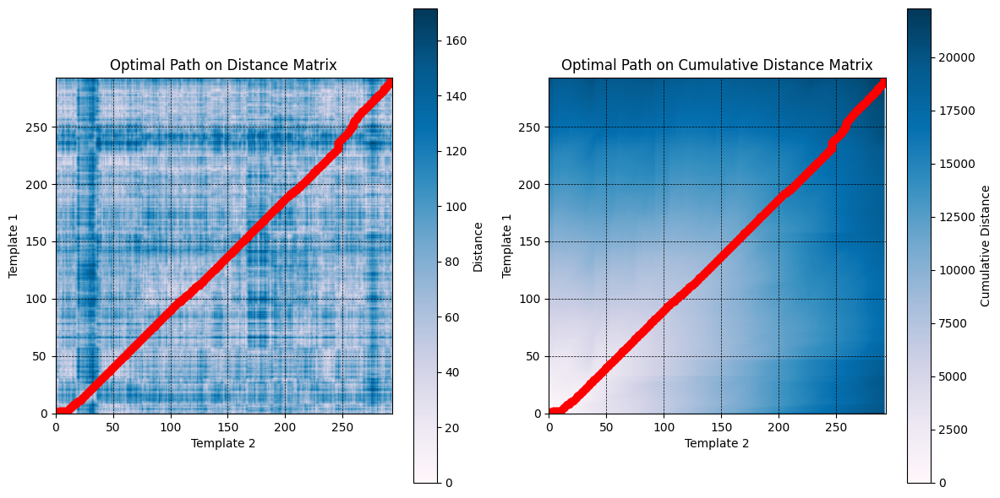

Optimal distance: 
21474.347648620605
Optimal path of digit6 repeatation 2 : 


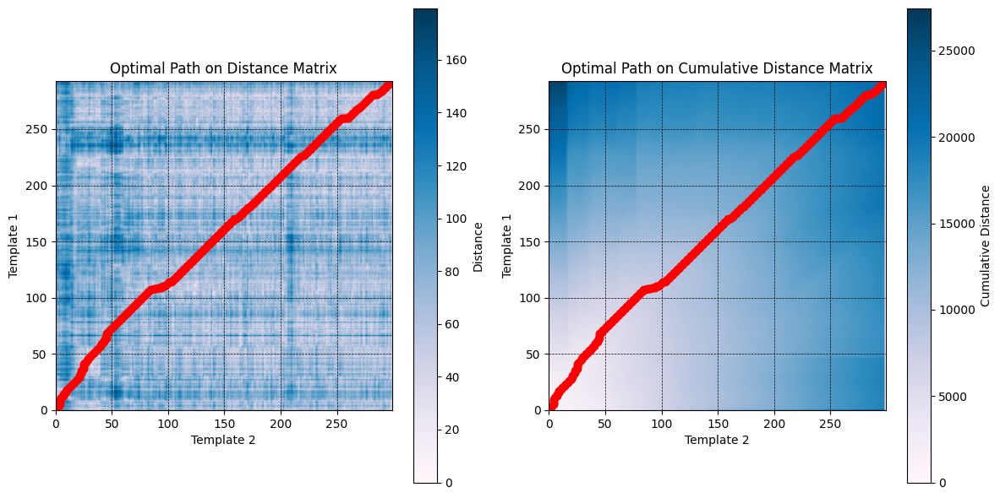

Optimal distance: 
20768.9292678833
Optimal path of digit6 repeatation 3 : 


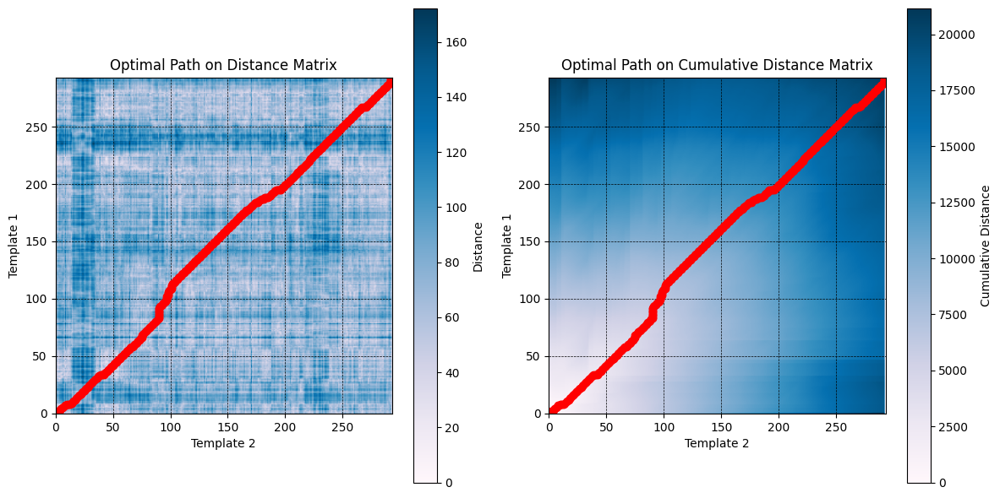

Optimal distance: 
22010.481424331665
Optimal path of digit7 repeatation 1 : 


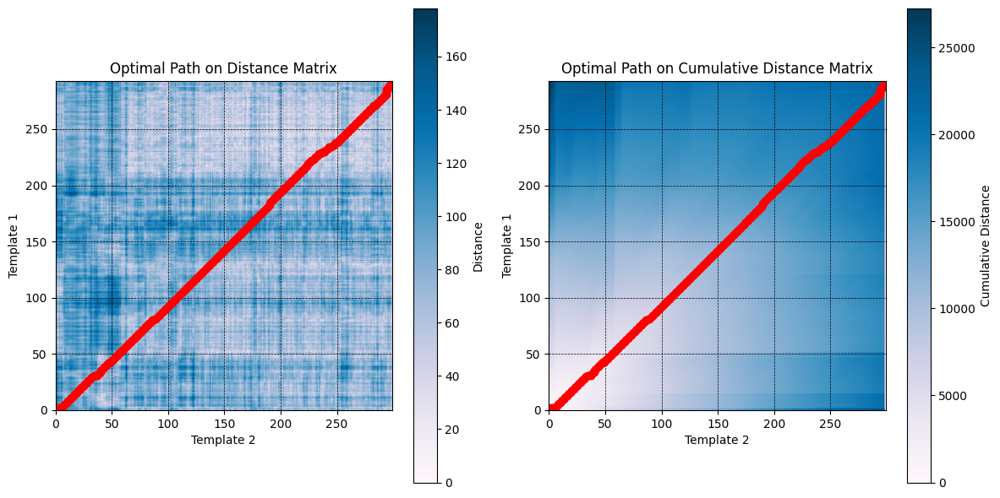

Optimal distance: 
22124.960878372192
Optimal path of digit7 repeatation 2 : 


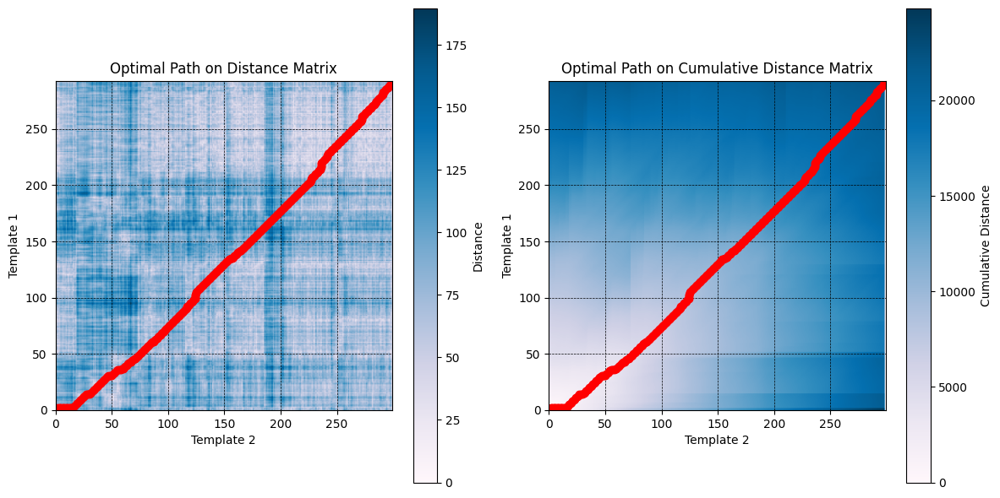

Optimal distance: 
20846.94153213501
Optimal path of digit7 repeatation 3 : 


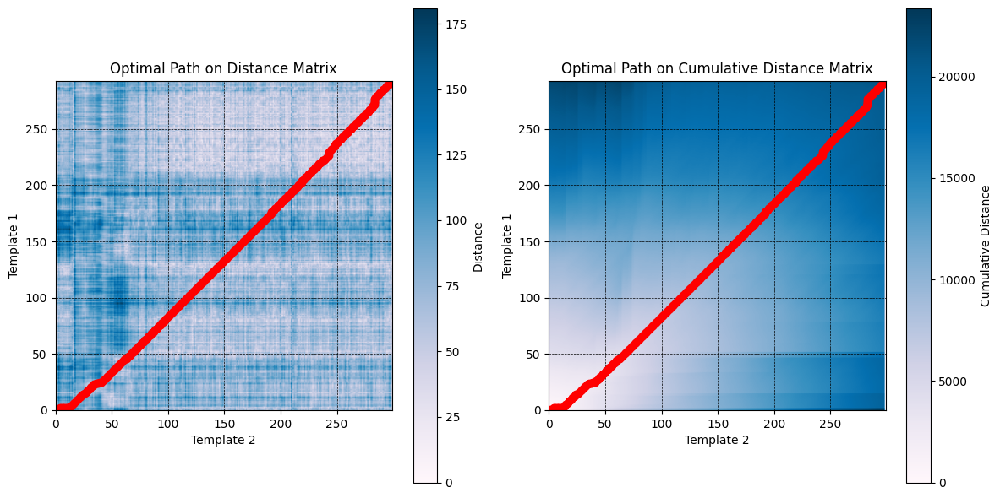

Optimal distance: 
18617.714838027954
Optimal path of digit8 repeatation 1 : 


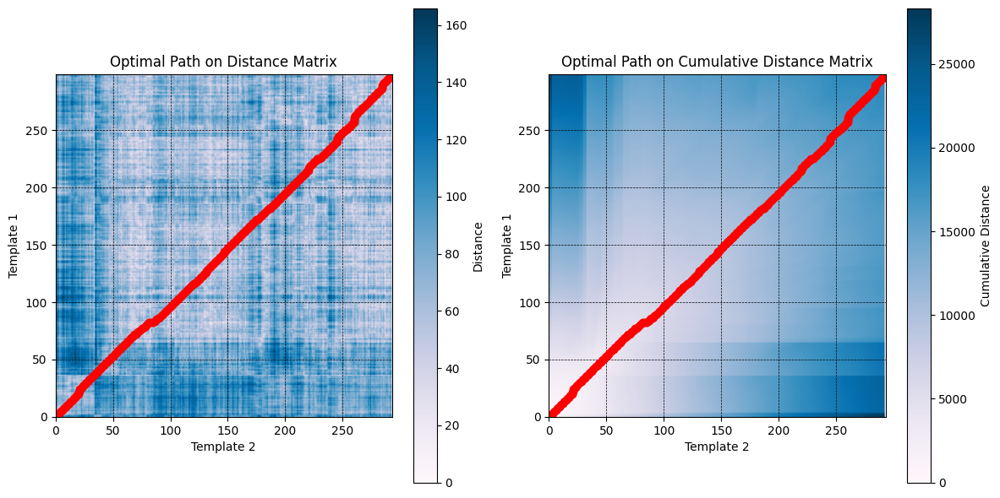

Optimal distance: 
18486.207675933838
Optimal path of digit8 repeatation 2 : 


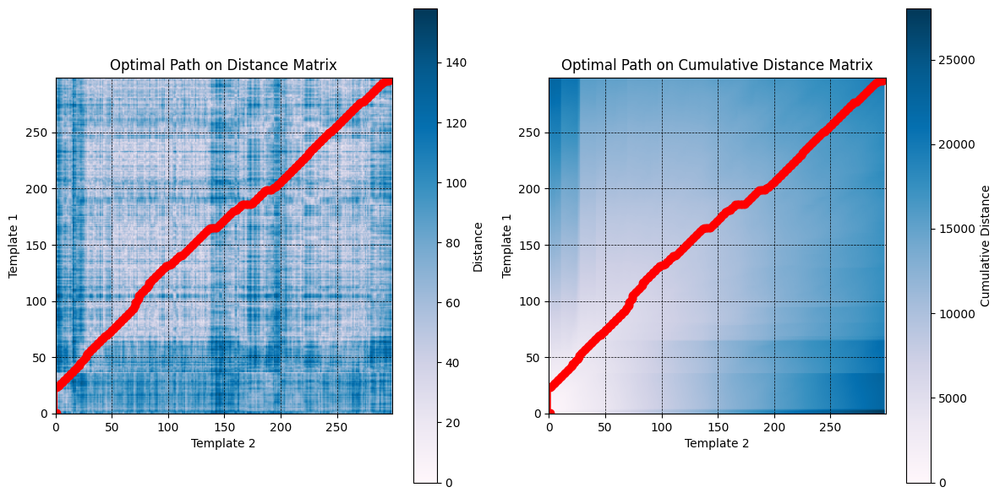

Optimal distance: 
17087.457662582397
Optimal path of digit8 repeatation 3 : 


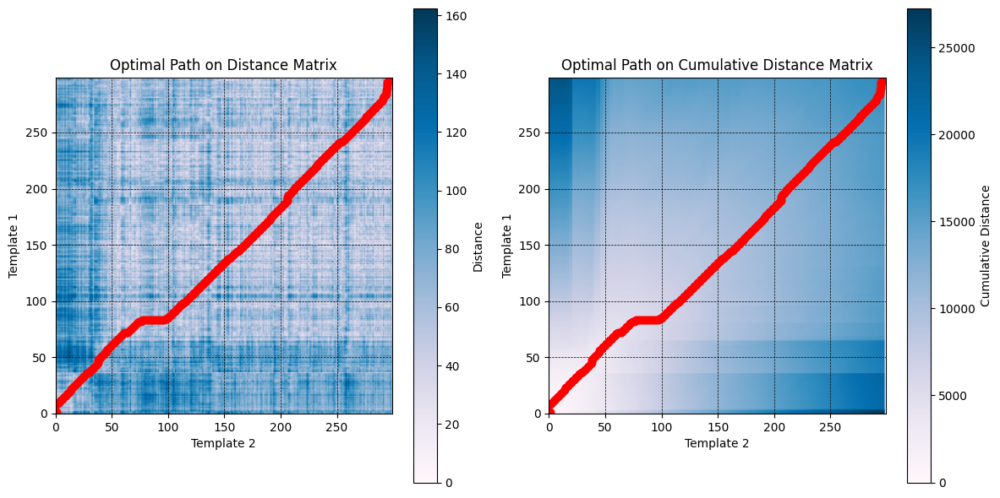

Optimal distance: 
17979.702669143677
Optimal path of digit9 repeatation 1 : 


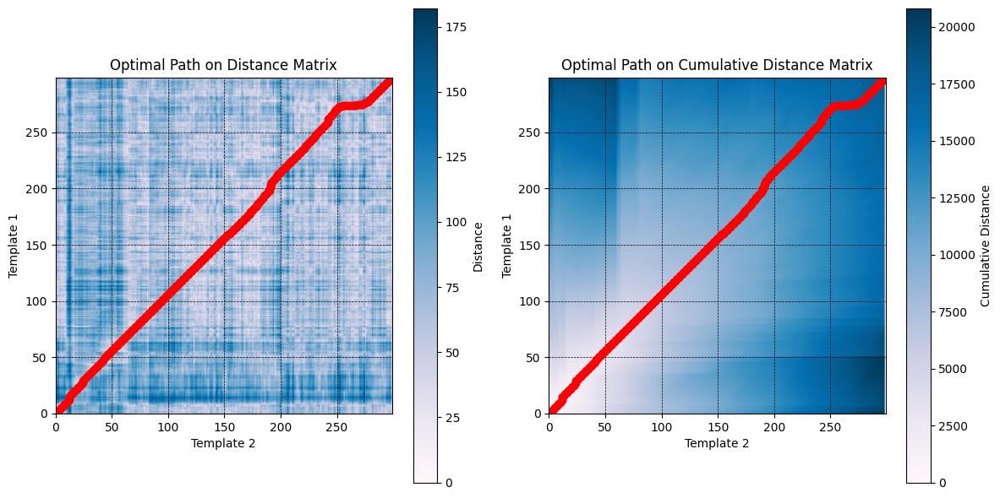

Optimal distance: 
16230.265884399414
Optimal path of digit9 repeatation 2 : 


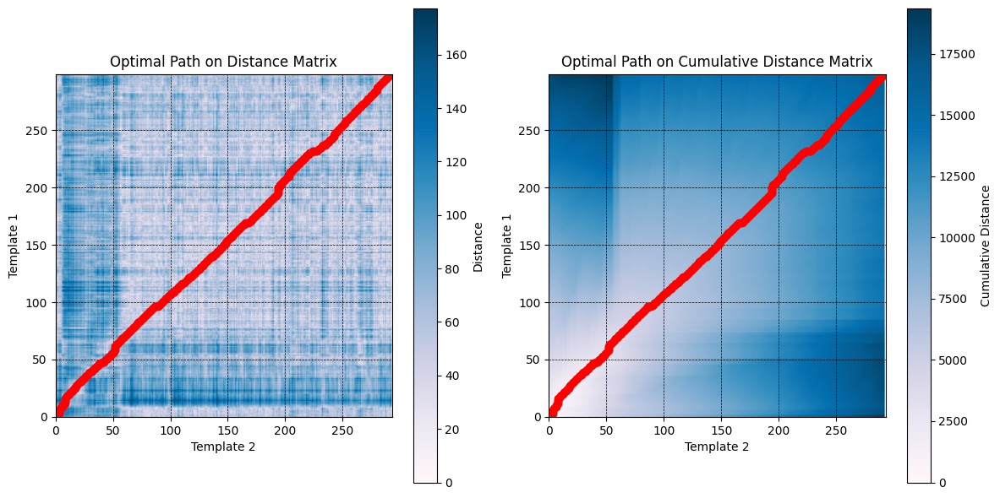

Optimal distance: 
17768.917221069336
Optimal path of digit9 repeatation 3 : 


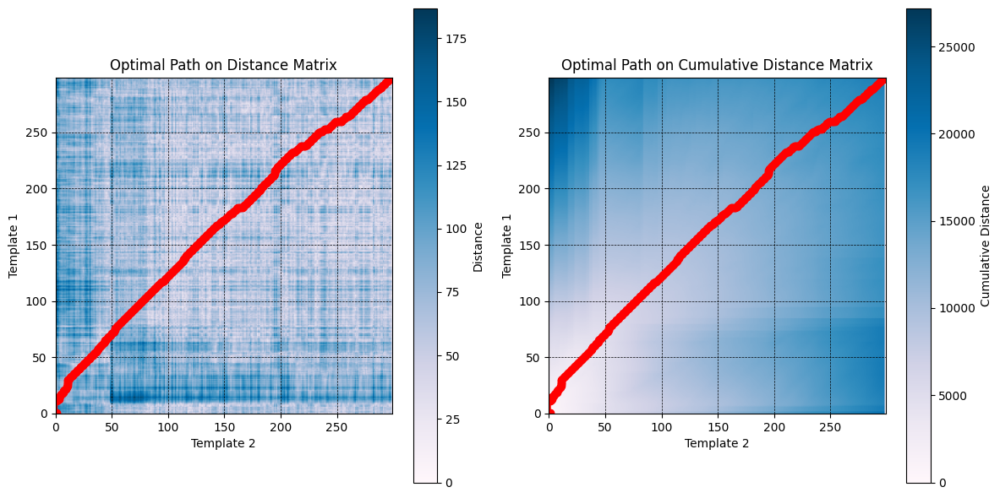

In [ ]:
#All imports
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import collections

###########################################################
#Function to obtain the optimal distance and path between two templates
###########################################################
def vectorDTW(template1,template2):
    #######################################################
    # Input  : Two templates
    # Output : DTW path and optimal distance
    #######################################################
    distance_matrix=np.zeros((len(template1)+1, len(template2)+1))
    for i in range(len(template1)):
      for j in range(len(template2)):
        distance_matrix[i][j] = np.linalg.norm(template1[i] - template2[j],2)

    #######################################################
    # Code snippet to create the cumulative distance matrix
    #######################################################
    # Initialize the cumulative distance matrix
    DTW_cumulate_Matrix = np.zeros((len(template1) + 1, len(template2) + 1))
    DTW_cumulate_Matrix[0][0] = distance_matrix[0][0]
    for i in range(1,len(template2)):
       DTW_cumulate_Matrix[0][i] = distance_matrix[0][i]+DTW_cumulate_Matrix[0][i-1]
    for i in range(1,len(template1)):
       DTW_cumulate_Matrix[i][0] = distance_matrix[i][0]+DTW_cumulate_Matrix[i-1][0]
    #Iterate through the sequence of points in sequences and compute the distance between the sequences.
    for i in range(1, len(template1)):
        for j in range(1, len(template2)):
            current_distance = distance_matrix[i][j]
            DTW_cumulate_Matrix[i][j] = current_distance + min(
                DTW_cumulate_Matrix[i-1][j],
                DTW_cumulate_Matrix[i-1][j - 1],
                DTW_cumulate_Matrix[i][j - 1]
            )




    #######################################################
    # Code snippet to find the optimal DTW path and the corresponding optimal distance
    opt_distance = 0.0
    i = len(template1) # length of the template1
    j = len(template2) # length of the template2
    path=[]
    path.append((i,j))
    i=i-1
    j=j-1
    opt_distance=opt_distance+np.linalg.norm(template1[i] - template2[j],2)
    while i!=0 and j!=0: #Start from the last point and backtrack
        #Get the indexes (i,j) of the small value among (DTW_cumulate_Matrix[i-1,j], DTW_cumulate_Matrix[i-1,j-1], DTW_cumulate_Matrix[i,j-1])
        indexes=[(i-1,j),(i-1,j-1),(i,j-1)]
        index = np.argmin([DTW_cumulate_Matrix[idx] for idx in indexes])
        i , j = indexes[index]

        # Add the current indexes distance
        opt_distance = opt_distance + np.linalg.norm(template1[i] - template2[j],2)   #Compute the distance between the points sequence1[i] and sequence2[j]



        #Store the required indexes to obtain the optimal path
        path.append((i+1,j+1))
    path.append((1,1))
    opt_distance = opt_distance + np.linalg.norm(template1[i] - template2[j],2)


    #######################################################
    # Return optimal distance and optimal dtw path
    #######################################################
    return path,opt_distance,distance_matrix,DTW_cumulate_Matrix




def plotDTWpath(template1, template2):
    # Compute DTW path and optimal distance
    optimal_path, opt_distance, distance_matrix, DTW_cumulative_Matrix = vectorDTW(template1, template2)

    # Plot distance matrix
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(distance_matrix, cmap='PuBu', origin='lower', extent=[0, len(template2), 0, len(template1)])
    plt.plot([p[1] for p in optimal_path], [p[0] for p in optimal_path], marker='o', color='r')
    plt.title('Optimal Path on Distance Matrix')
    plt.xlabel('Template 2')
    plt.ylabel('Template 1')
    plt.colorbar(label='Distance')
    plt.grid(color='k', linestyle='--', linewidth=0.5)

    # Plot cumulative distance matrix
    plt.subplot(1, 2, 2)
    plt.imshow(DTW_cumulative_Matrix, cmap='PuBu', origin='lower', extent=[0, len(template2), 0, len(template1)])
    plt.plot([p[1] for p in optimal_path], [p[0] for p in optimal_path], marker='o', color='r')
    plt.title(f'Optimal Path on Cumulative Distance Matrix')
    plt.xlabel('Template 2')
    plt.ylabel('Template 1')
    plt.colorbar(label='Cumulative Distance')
    plt.grid(color='k', linestyle='--', linewidth=0.5)

    plt.tight_layout()
    plt.show()

for i in range(10):
  for j in range(3):
    a,b,c,d=vectorDTW(template1[i], template2[i][j])
    print('Optimal distance: ')
    print(b)
    print('\033[1m' + f'Optimal path of digit{i} repeatation {j+1} : '.format(i,j))
    plotDTWpath(template1[i], template2[i][j])